In [34]:
import rasterio
from rasterio.plot import show
from rasterio.enums import Resampling
import pyproj
from matplotlib import pyplot
import numpy as np
import rioxarray
from rioxarray import open_rasterio

In [3]:
img = rioxarray.open_rasterio('data/example_strawberry_focus_area.tif')
img_wgs84 = img.rio.reproject("EPSG:4326")
img_wgs84.rio.to_raster('converted_example_strawberry_focus_area.tif')

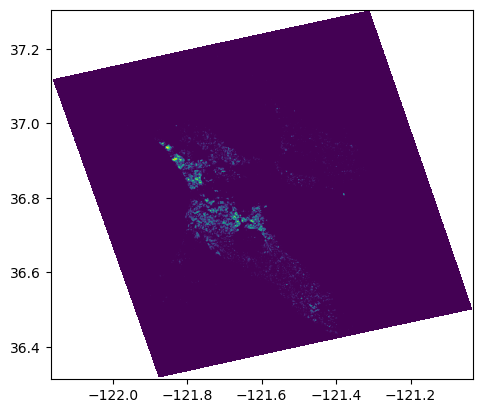

0
255
3864713
3817297
47416
3864713


In [4]:
wgs84_cropscape_example = rasterio.open('converted_example_strawberry_focus_area.tif')
show(wgs84_cropscape_example)


sample_data = wgs84_cropscape_example.read(1)
min_value=np.min(sample_data)
max_value=np.max(sample_data)
count=np.sum(sample_data>0)
count_255=np.sum(sample_data==255)
count_221=np.sum(sample_data==221)

print(min_value)
print(max_value)
print(count)
print(count_255)
print(count_221)
print(count_221+count_255)


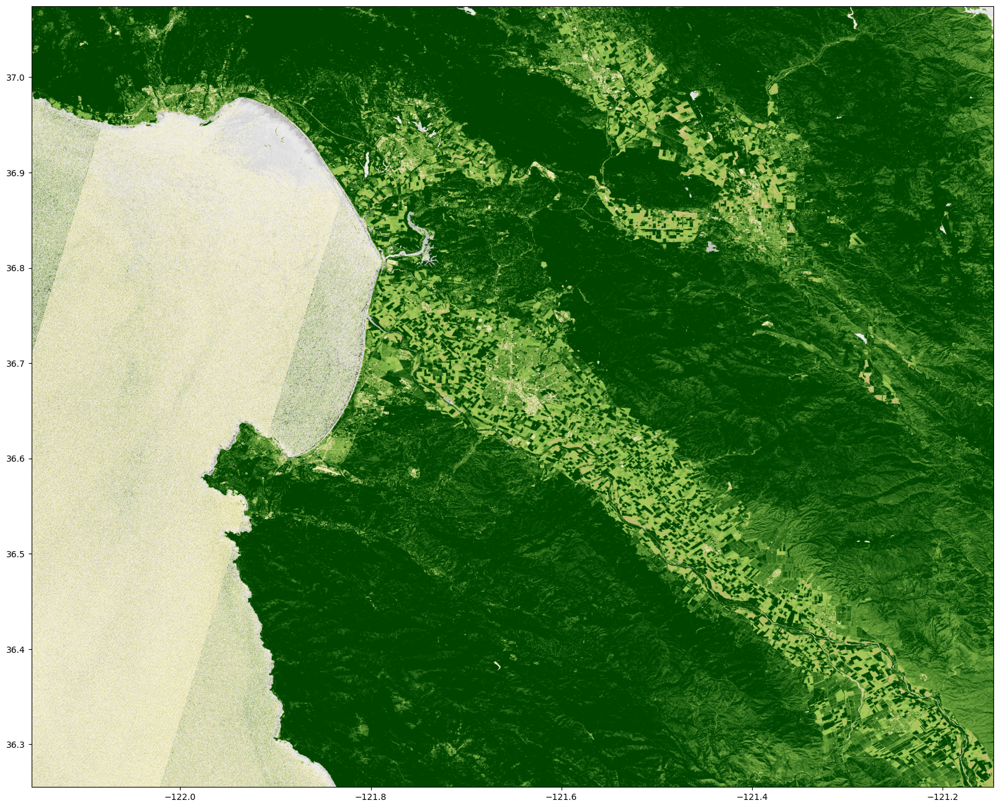

<Axes: >

In [5]:
pyplot.figure(figsize=(20,20))
copernicus_example = rasterio.open('example_copernicus_ndvi.tiff')
show(copernicus_example)

In [6]:



mask = wgs84_cropscape_example.read(1)
ndvi = copernicus_example.read(1)
masked_example = np.where(mask>1,copernicus_example,0)

In [7]:
type(masked_example)

numpy.ndarray

In [8]:
with rasterio.open('example_copernicus_ndvi.tiff') as target:
    target_array = target.read(1)
    target_profile = target.profile


Masked TIFF file saved at example_masked_output.tiff


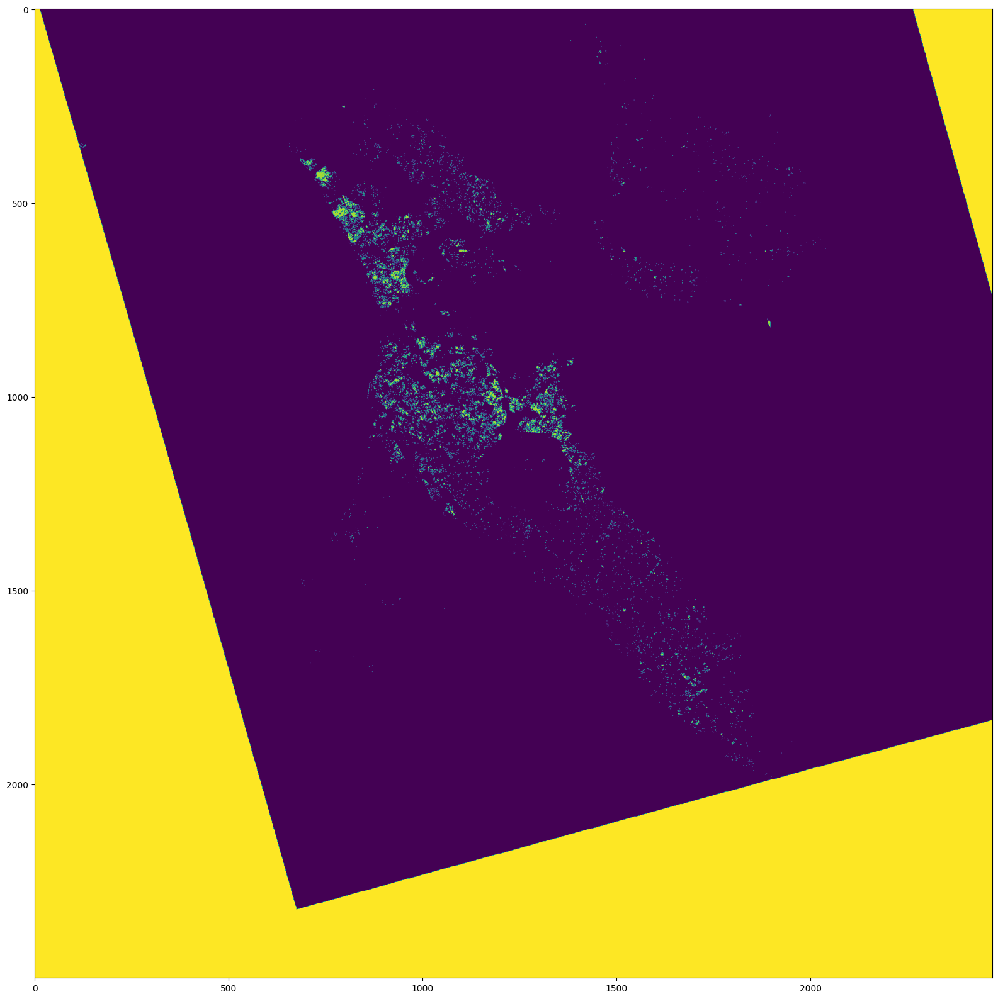

<Axes: >

In [9]:
def resample_raster(src_raster, target_raster_profile, resampling_method=Resampling.nearest):
    """
    Resample the source raster to match the target raster's profile.
    """
    with rasterio.open(src_raster) as src:
        data = np.empty((src.count, target_raster_profile['height'], target_raster_profile['width']), dtype=src.dtypes[0])
        transform = target_raster_profile['transform']
        
        for i in range(1, src.count + 1):
            rasterio.warp.reproject(
                source=rasterio.band(src, i),
                destination=data[i - 1],
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=target_raster_profile['crs'],
                resampling=resampling_method
            )
        return data[0], transform

#read the target that needs to be masked
with rasterio.open('example_copernicus_ndvi.tiff') as target:
    target_array = target.read() 
    target_profile = target.profile

#resample source to match the target
source_resampled, _ = resample_raster('converted_example_strawberry_focus_area.tif', target_profile)

#set masking
threshold = 221
mask_array = source_resampled == threshold

# Apply the mask
masked_array = np.where(mask_array, target_array, 0)  # Replace masked areas with 0

# Save the masked array to a new TIFF file
output_path = 'example_masked_output.tiff'
with rasterio.open(output_path, 'w', **target_profile) as dst:
    for i in range(target_array.shape[0]):
        dst.write(masked_array[i].astype('float32'), i+1)

print(f"Masked TIFF file saved at {output_path}")

pyplot.figure(figsize=(20,20))
show(source_resampled)

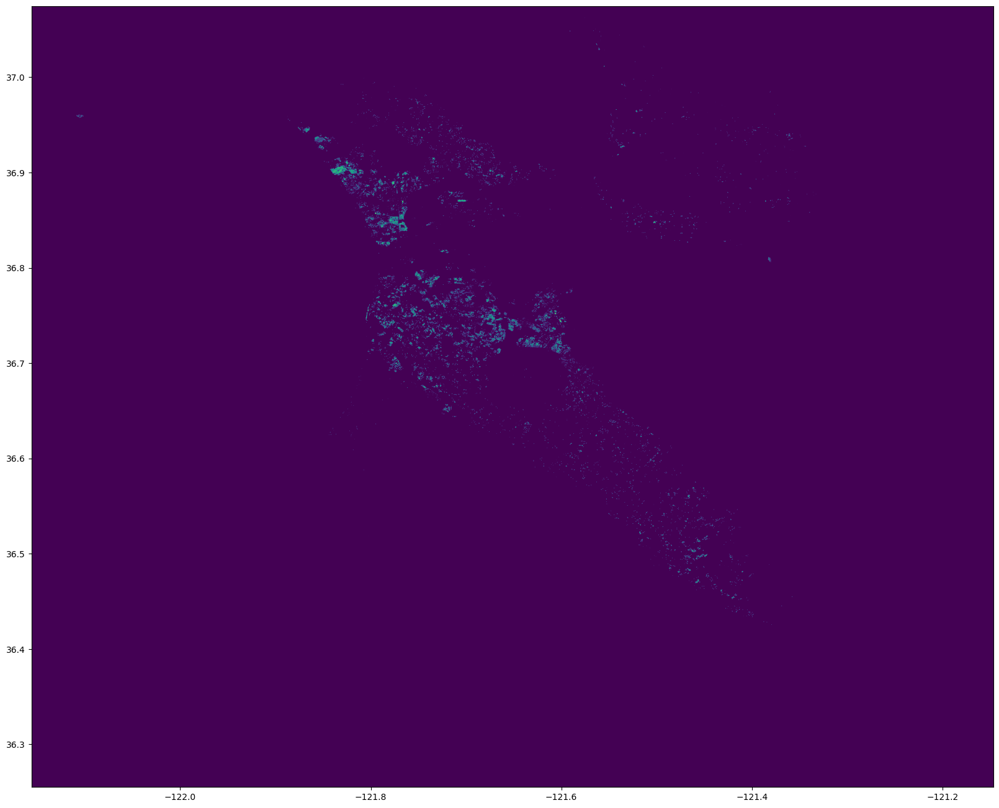

<Axes: >

In [10]:
pyplot.figure(figsize=(20,20))
masked_example = rasterio.open('example_masked_output.tiff')
show(masked_example)

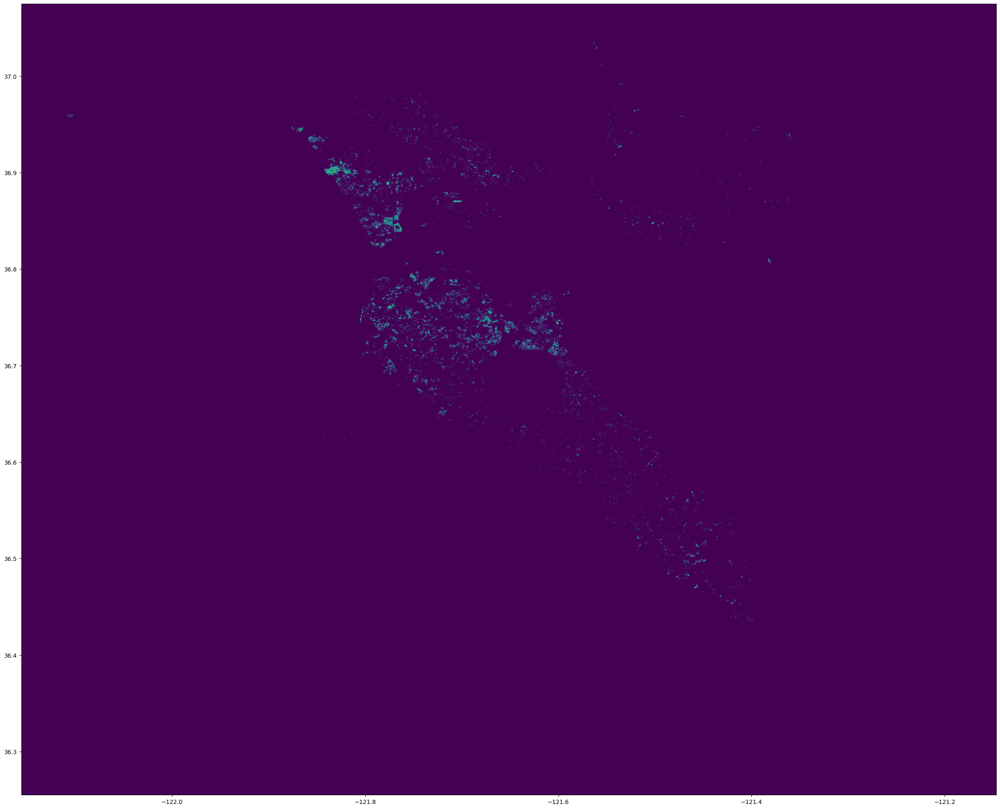

<Axes: >

In [11]:
pyplot.figure(figsize=(30,30))
masked_example = rasterio.open('example_masked_output.tiff')
show(masked_example)

In [12]:

# landsat_example = rasterio.open('data/LC08_L2SP_042033_20200912_20200919_02_T1/LC08_L2SP_042033_20200912_20200919_02_T1_SR_EVI.tif')

# project = pyproj.Transformer.from_crs(rdata_crs, 'EPSG:4326', always_xy=True).transform

landsat_example = rioxarray.open_rasterio('data/LC09_L2SP_043035_20211121_20230407_02_T1/LC09_L2SP_043035_20211121_20230407_02_T1_SR_EVI.tif')
landsat_example = landsat_example.rio.reproject("EPSG:4326")
landsat_example.rio.to_raster('converted_landsat_example.tif')



In [13]:
img = rioxarray.open_rasterio('data/cropscape-strawberries-06053-2023.tif')
img_wgs84 = img.rio.reproject("EPSG:4326")
img_wgs84.rio.to_raster('converted_monterey_strawberry_focus_area.tif')

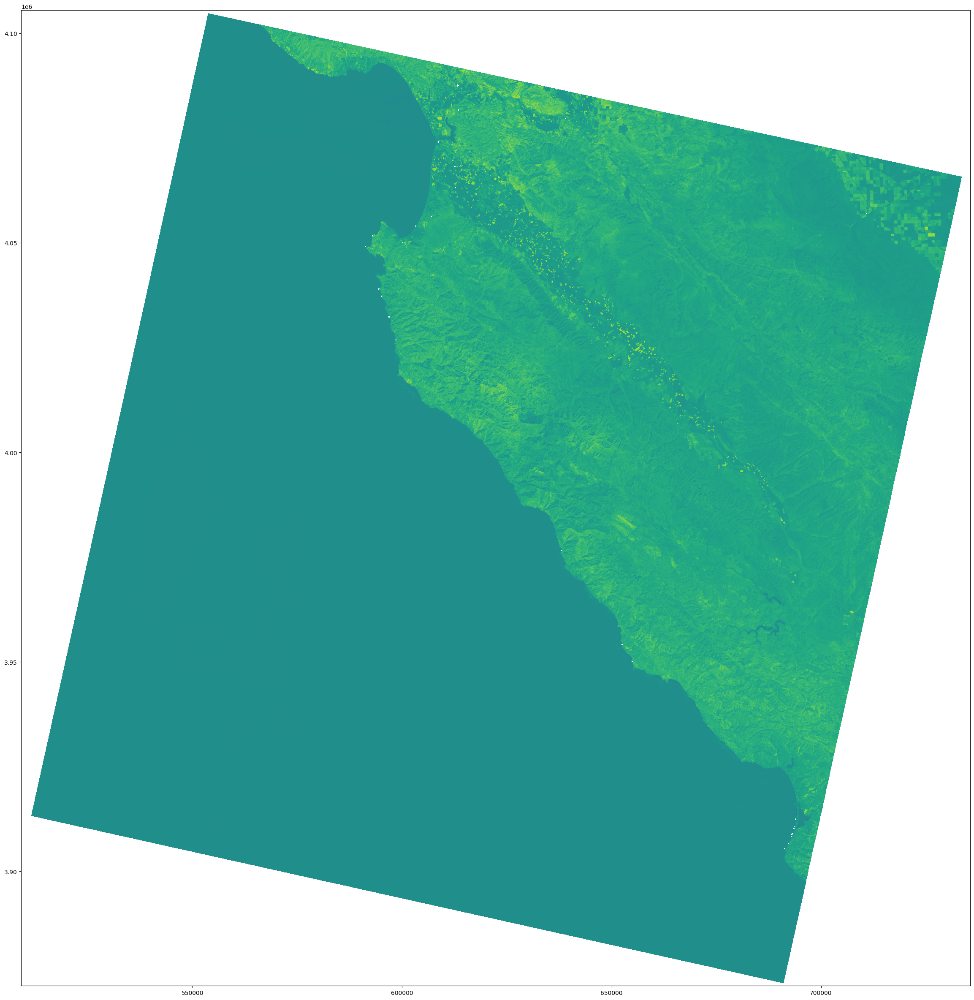

<Axes: >

In [28]:
pyplot.figure(figsize=(30,30))

landsat_example=rasterio.open('data/LC09_L2SP_043035_20211121_20230407_02_T1/LC09_L2SP_043035_20211121_20230407_02_T1_SR_EVI.tif')

show(landsat_example)

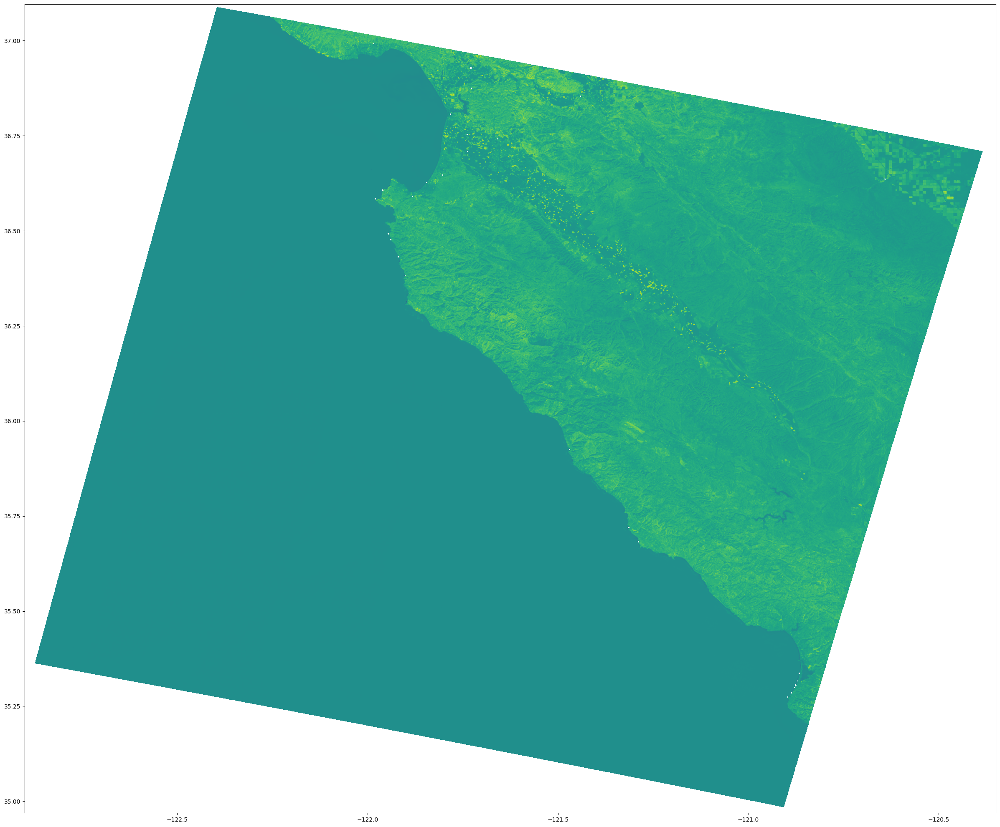

<Axes: >

In [14]:
pyplot.figure(figsize=(30,30))

converted_landsat_example=rasterio.open('converted_landsat_example.tif')

show(converted_landsat_example)

In [15]:
x=-121.5
y=36.75


for val in converted_landsat_example.sample([(x,y)]):
    print(val)
    print(type(val))

[2511]
<class 'numpy.ndarray'>


Masked TIFF file saved at example_masked_evi_output.tiff


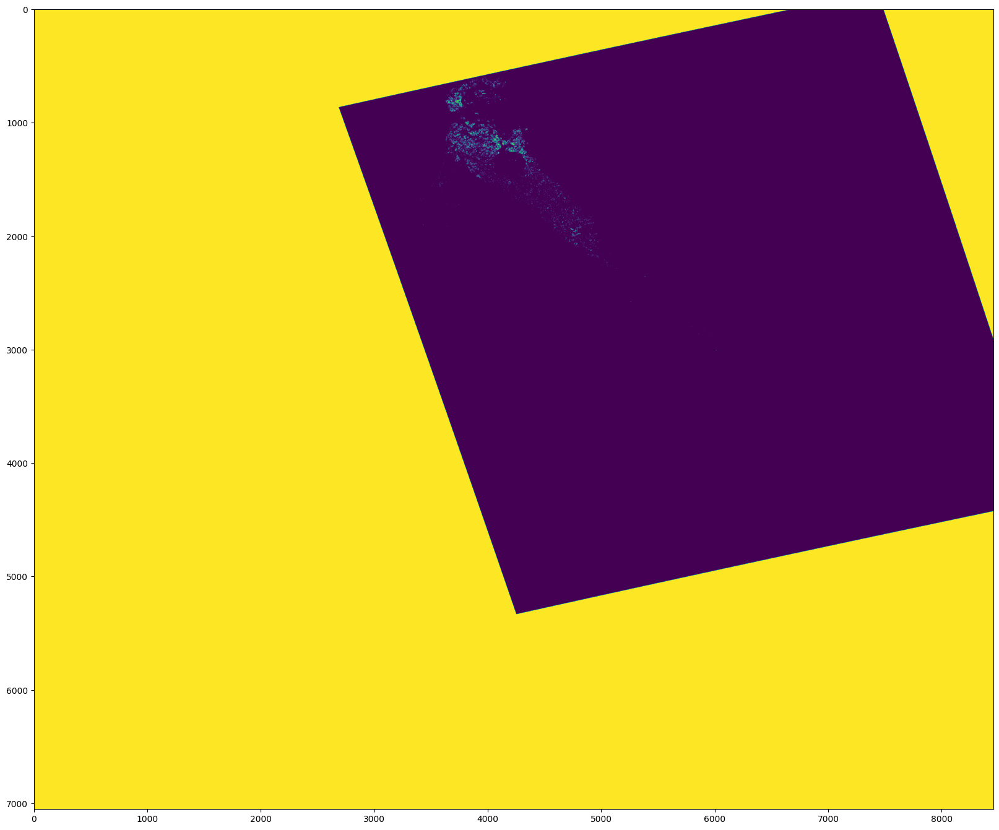

<Axes: >

In [195]:

#read the target that needs to be masked
with rasterio.open('converted_landsat_example.tif') as target:
    target_array = target.read() 
    target_profile = target.profile

#resample source to match the target
source_resampled, _ = resample_raster('converted_monterey_strawberry_focus_area.tif', target_profile)

#set masking
threshold = 221
mask_array = source_resampled == threshold

# Apply the mask
masked_array = np.where(mask_array, target_array, 0)  # Replace masked areas with NaN

# Save the masked array to a new TIFF file
output_path = 'example_masked_evi_output.tiff'
with rasterio.open(output_path, 'w', **target_profile) as dst:
    for i in range(target_array.shape[0]):
        dst.write(masked_array[i].astype('float32'), i+1)

print(f"Masked TIFF file saved at {output_path}")

pyplot.figure(figsize=(20,20))
show(source_resampled)

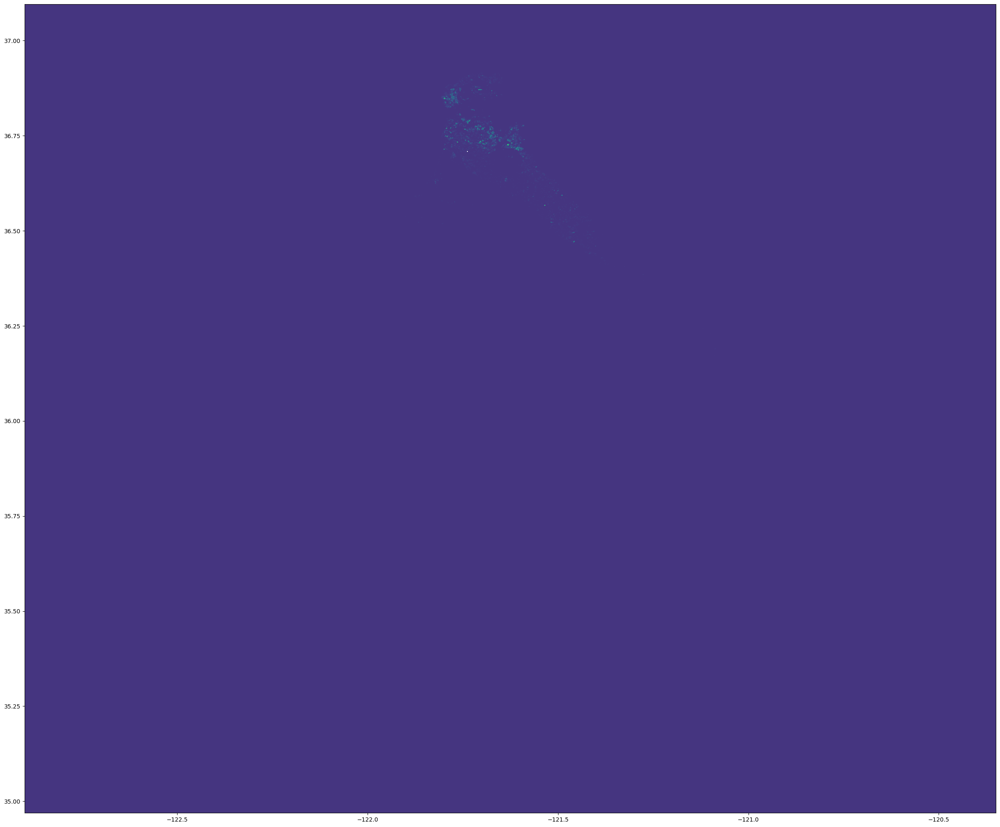

<Axes: >

In [196]:
pyplot.figure(figsize=(30,30))
masked_example = rasterio.open('example_masked_evi_output.tiff')
show(masked_example)

In [197]:
sample_data_array = masked_example.read()
print(sample_data_array.shape)

(1, 7051, 8457)


In [198]:
#sample masked data EDA
sample_data = masked_example.read(1)

min_value=np.min(sample_data)
max_value=np.max(sample_data)

print("Min:",min_value)
print("Max:",max_value)
print("Length:",len(sample_data.flatten()))

Min: -19999
Max: 9124
Length: 59630307


In [199]:
bounded_sample = sample_data[(sample_data >0) & (sample_data <= 10000)]
print(bounded_sample.shape)
print("Length Bounded Sample:",len(bounded_sample))

(41444,)
Length Bounded Sample: 41444


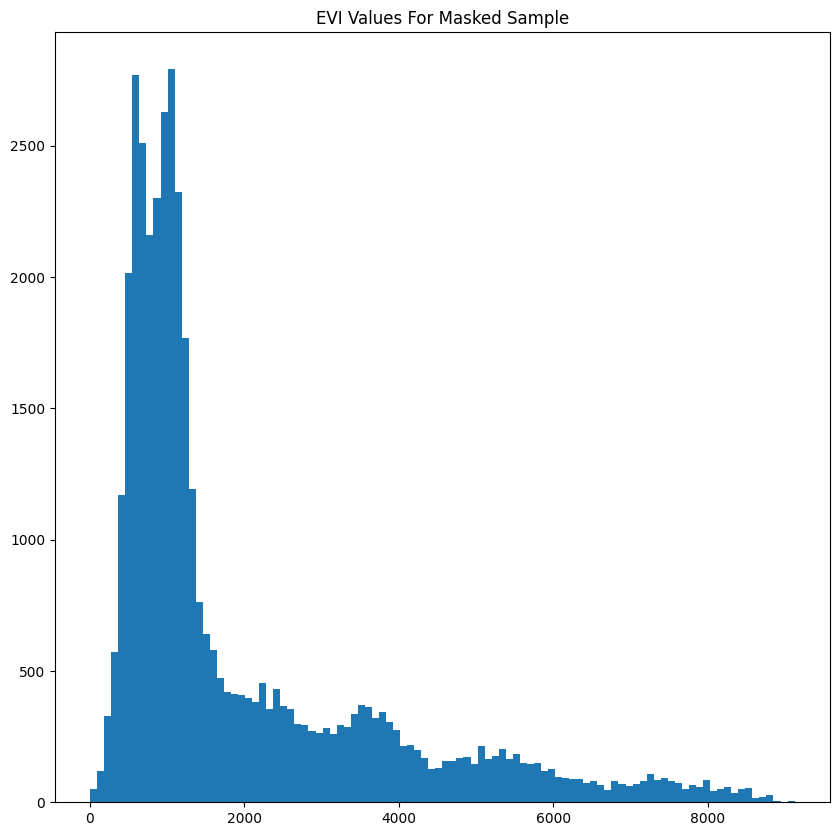

In [201]:
pyplot.figure(figsize=(10,10))
pyplot.hist(bounded_sample,bins=100)
pyplot.title('EVI Values For Masked Sample')

pyplot.show()

In [16]:
import os

In [41]:
def reproject_to_wgs84(file_path,target_path):
    with open_rasterio(file_path) as img:
        reprojected_img = img.rio.reproject('EPSG:4326')
        reprojected_img.rio.to_raster(target_path)


In [42]:
for filename in os.listdir('./data'):
    if 'cropscape-strawberries' in filename:
        file_path=os.path.join('./data', filename)
        if os.path.isfile(file_path):
            target_path=os.path.join('./data', f'converted-{filename}')
            reproject_to_wgs84(file_path, target_path)
            print(f'Processed {file_path} to {target_path}')

Processed ./data/cropscape-strawberries-06053-2016.tif to ./data/converted-cropscape-strawberries-06053-2016.tif
Processed ./data/cropscape-strawberries-06053-2017.tif to ./data/converted-cropscape-strawberries-06053-2017.tif
Processed ./data/cropscape-strawberries-06053-2015.tif to ./data/converted-cropscape-strawberries-06053-2015.tif
Processed ./data/cropscape-strawberries-06053-2014.tif to ./data/converted-cropscape-strawberries-06053-2014.tif
Processed ./data/cropscape-strawberries-06053-2010.tif to ./data/converted-cropscape-strawberries-06053-2010.tif
Processed ./data/cropscape-strawberries-06053-2011.tif to ./data/converted-cropscape-strawberries-06053-2011.tif
Processed ./data/cropscape-strawberries-06053-2013.tif to ./data/converted-cropscape-strawberries-06053-2013.tif
Processed ./data/cropscape-strawberries-06053-2012.tif to ./data/converted-cropscape-strawberries-06053-2012.tif
Processed ./data/cropscape-strawberries-06053-2023.tif to ./data/converted-cropscape-strawberrie

In [43]:
for filename in os.listdir('./data/landsat_evi_monterey_extracted'):
    if 'SR_EVI' in filename:
        file_path=os.path.join('./data/landsat_evi_monterey_extracted', filename)
        if os.path.isfile(file_path):
            target_path=os.path.join('./data/landsat_evi_monterey_extracted/converted', f'converted-{filename}')
            reproject_to_wgs84(file_path, target_path)
            print(f'Processed {file_path} to {target_path}')
print('completed')

Processed ./data/landsat_evi_monterey_extracted/LC08_L2SP_043035_20170404_20200904_02_T1_SR_EVI.tif to ./data/landsat_evi_monterey_extracted/converted-LC08_L2SP_043035_20170404_20200904_02_T1_SR_EVI.tif
Processed ./data/landsat_evi_monterey_extracted/LC08_L2SP_043035_20240407_20240418_02_T1_SR_EVI.tif to ./data/landsat_evi_monterey_extracted/converted-LC08_L2SP_043035_20240407_20240418_02_T1_SR_EVI.tif
Processed ./data/landsat_evi_monterey_extracted/LC08_L2SP_043035_20180525_20200901_02_T1_SR_EVI.tif to ./data/landsat_evi_monterey_extracted/converted-LC08_L2SP_043035_20180525_20200901_02_T1_SR_EVI.tif
Processed ./data/landsat_evi_monterey_extracted/LC09_L2SP_043035_20230702_20230704_02_T1_SR_EVI.tif to ./data/landsat_evi_monterey_extracted/converted-LC09_L2SP_043035_20230702_20230704_02_T1_SR_EVI.tif
Processed ./data/landsat_evi_monterey_extracted/LC09_L2SP_043035_20220426_20230418_02_T1_SR_EVI.tif to ./data/landsat_evi_monterey_extracted/converted-LC09_L2SP_043035_20220426_20230418_02

In [46]:

#define function to perform masking
def mask_tif(target_path, source_path, output_path):
    with rasterio.open(target_path) as target:
        target_array = target.read()
        target_profile = target.profile

    #resample source to match the target
    source_resampled, _ = resample_raster(source_path, target_profile)

    #set masking
    threshold = 221
    mask_array = source_resampled == threshold

    # Apply the mask
    masked_array = np.where(mask_array, target_array, 0)

    # Save the masked array to a new TIFF file
    with rasterio.open(output_path, 'w', **target_profile) as dst:
        for i in range(target_array.shape[0]):
            dst.write(masked_array[i].astype('float32'), i+1)

    print(f"Masked TIFF file saved at {output_path}")



In [49]:
#target directory is the landsat evi files directory, source directory is the masked cropscape directory
target_dir = "./data/landsat_evi_monterey_extracted/converted"
source_dir = "./data"
dest_dir = "./data/landsat_evi_monterey_masked"

# Check if destination directory exists, create if it doesn't
if not os.path.exists(dest_dir):
    os.makedirs(dest_dir)

# Iterate over each .tif file in the target directory
for target_filename in os.listdir(target_dir):
    if target_filename.endswith('SR_EVI.tif'):
        target_file = os.path.join(target_dir, target_filename)
        year=target_filename[27:31]
        print("Landsat Year:", year)
        source_file = os.path.join(source_dir, f"converted-cropscape-strawberries-06053-{year}.tif")
        output_file = os.path.join(dest_dir, f"{os.path.splitext(target_filename)[0]}_masked.tiff")

        # Check if source file exists
        if os.path.exists(source_file):
            print(f"Processing {target_file} and {source_file}")
            mask_tif(target_file, source_file, output_file)
        else:
            print(f"Source file not found for {target_file}: {source_file}")

print("Processing complete.")

Landsat Year: 2014
Processing ./data/landsat_evi_monterey_extracted/converted/converted-LC08_L2SP_043035_20140412_20200911_02_T1_SR_EVI.tif and ./data/converted-cropscape-strawberries-06053-2014.tif
Masked TIFF file saved at ./data/landsat_evi_monterey_masked/converted-LC08_L2SP_043035_20140412_20200911_02_T1_SR_EVI_masked.tiff
Landsat Year: 2024
Source file not found for ./data/landsat_evi_monterey_extracted/converted/converted-LC08_L2SP_043035_20240219_20240229_02_T1_SR_EVI.tif: ./data/converted-cropscape-strawberries-06053-2024.tif
Landsat Year: 2022
Processing ./data/landsat_evi_monterey_extracted/converted/converted-LC08_L2SP_043035_20221112_20221122_02_T1_SR_EVI.tif and ./data/converted-cropscape-strawberries-06053-2022.tif
Masked TIFF file saved at ./data/landsat_evi_monterey_masked/converted-LC08_L2SP_043035_20221112_20221122_02_T1_SR_EVI_masked.tiff
Landsat Year: 2023
Processing ./data/landsat_evi_monterey_extracted/converted/converted-LC08_L2SP_043035_20230507_20230517_02_T1_

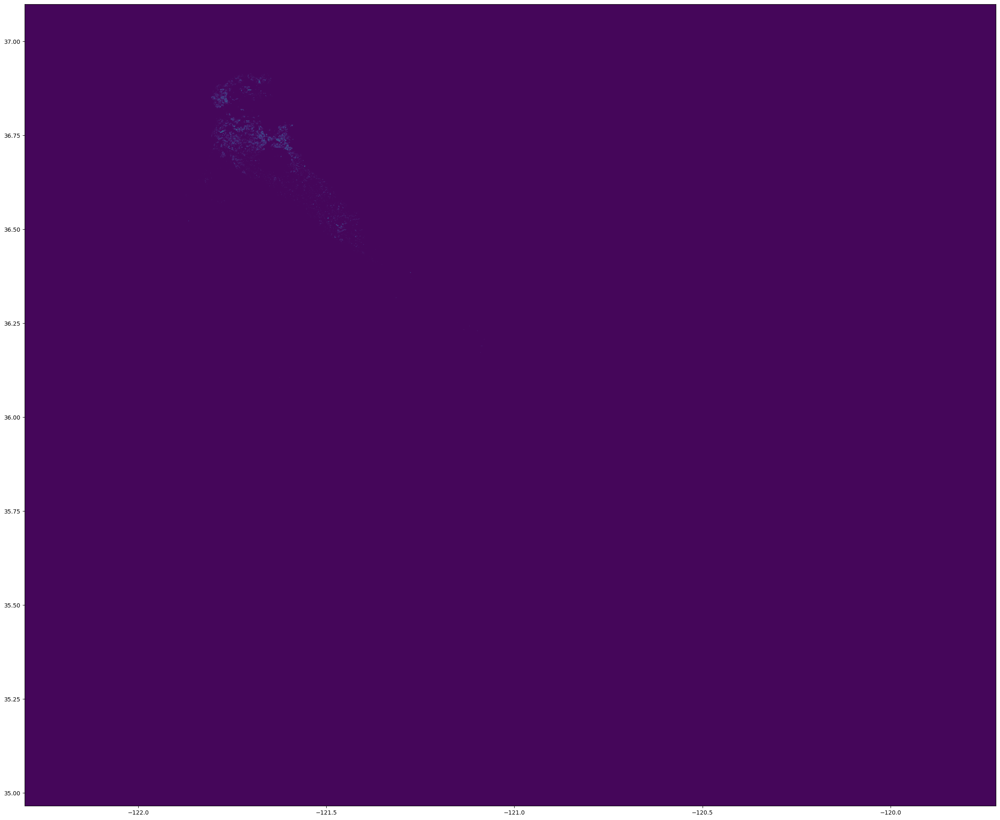

<Axes: >

In [52]:
pyplot.figure(figsize=(30,30))
masked_example = rasterio.open('data/landsat_evi_monterey_masked/converted-LC08_L2SP_043035_20230507_20230517_02_T1_SR_EVI_masked.tiff')
show(masked_example)